##**Customer Purchase Predictive model**

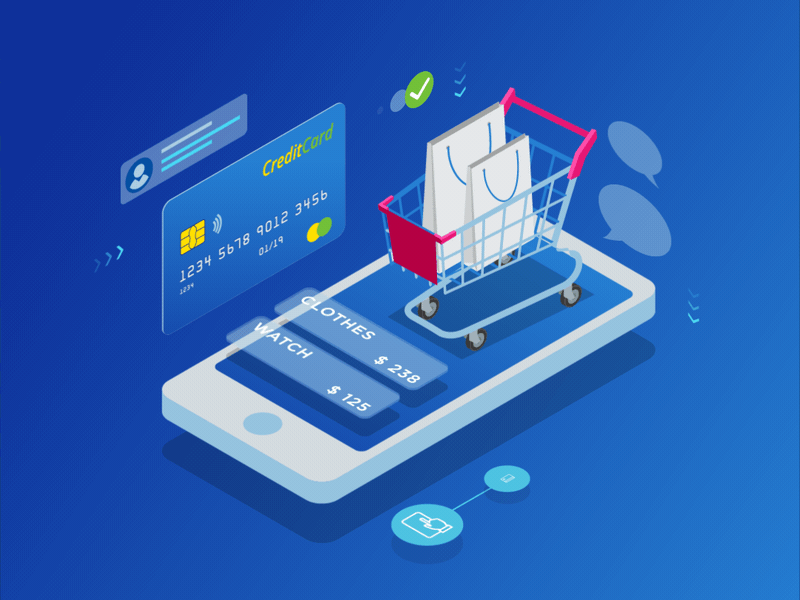

 **Name : Ramsi Nilopher**

**Batch : D35**

# **1.Overview of Problem Statement**

E-commerce businesses aim to understand customer behavior to improve sales and marketing strategies. The challenge is to predict whether a visitor will make a purchase (Revenue = True) based on their browsing patterns, time spent on different pages, bounce rates, exit rates, traffic sources, and other factors.

A machine learning model can help businesses:

* Identify high-potential buyers for targeted marketing


* Improve website design to reduce bounce rates.

* Optimize ad spending by focusing on high-converting users.


By analyzing user session data, this model will help enhance customer engagement and boost revenue through data-driven decisions.

# **2. Objective**

1. Develop a classification model that predicts whether a customer will make a purchase.
2. Identify key factors influencing purchase decisions.
3. Improve website design and marketing efforts based on customer behavior insights.

# **3. Data Description**

The dataset contains various features related to user sessions on an e-commerce website. Below is a brief explanation of each feature:

1. User Behavior Features.
* Administrative – Number of administrative pages visited (e.g., account settings, policies).
* Administrative_Duration – Total time spent on administrative pages.
* Informational – Number of informational pages visited (e.g., FAQs, about us).
* Informational_Duration – Total time spent on informational pages.
* ProductRelated – Number of product-related pages visited.
* ProductRelated_Duration – Total time spent on product-related pages.
2. Engagement & Interaction Features.
* BounceRates – The percentage of visitors who leave after viewing only one page.
* ExitRates – The percentage of visitors who exit from a specific page.
* PageValues – The calculated value of a page based on its contribution to revenue.
* SpecialDay – Indicates closeness to a special shopping day (e.g., Black Friday).
3. Session & Technical Features.
* Month – The month in which the session occurred (e.g., Feb, March).
* OperatingSystems – The type of OS used by the visitor (1, 2, 3, etc.).
* Browser – The browser used by the visitor (Chrome, Firefox, etc.).
* Region – The geographical region of the visitor.
* TrafficType – The source of website traffic (direct, referral, ads, etc.).
* VisitorType – Whether the visitor is Returning_Visitor, New_Visitor, or Other.
* Weekend – Whether the session happened on a weekend (True/False).
4. Target Variable (Prediction Output).
* Revenue – Indicates if the visitor made a purchase (True = Purchase, False = No Purchase).

This dataset is well-suited for building a classification model to predict whether a visitor will complete a purchase based on their browsing behavior.


- Source: The dataset can be downloaded from the link :
https://archive.ics.uci.edu/static/public/468/online+shoppers+purchasing+intention+dataset.zip

In [ ]:
#importing libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.special import boxcox1p
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import PowerTransformer
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import joblib

# **4. Data Collection:**

In [ ]:
data = pd.read_csv("/content/online_shoppers_intention.csv")


In [ ]:
data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

**Dataset Overview**

The dataset contains 12,330 entries (rows) and 18 columns (features).
There are no missing values in any column, making it ready for analysis without handling NaNs.

**Data Types and Feature Categories**

Numerical Features (14 columns)

Integer (7 columns): Administrative, Informational, ProductRelated, OperatingSystems, Browser, Region, TrafficType.

Float (7 columns): Administrative_Duration, Informational_Duration, ProductRelated_Duration, BounceRates, ExitRates, PageValues, SpecialDay.
These features mainly capture user behavior (e.g., page visits, session duration, bounce rates).

Categorical Features (4 columns)

Object (2 columns): Month (categorical time-based feature), VisitorType (New/Returning).

Boolean (2 columns): Weekend, Revenue (Target variable).

In [ ]:
data.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


The dataset reveals significant variability in user engagement, with large differences between the mean and median values in features like ProductRelated_Duration and PageValues, indicating the presence of highly engaged users who influence overall metrics. Many users do not interact with Administrative and Informational pages, as shown by their median values of zero. High standard deviations and extreme maximum values suggest outliers, where a few users spend an unusually long time browsing or making large transactions

#**5. Data Preprocessing - Data Cleaning:**

**Check for missing values**

In [ ]:
data.isnull().sum()

,0
Administrative,0
Administrative_Duration,0
Informational,0
Informational_Duration,0
ProductRelated,0
ProductRelated_Duration,0
BounceRates,0
ExitRates,0
PageValues,0
SpecialDay,0


Theare are no null values in this dataset

**Check for dupliactes**

In [ ]:
data.duplicated().sum()

125

In [ ]:
data= data.drop_duplicates()
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [ ]:
data.duplicated().sum()

0

**Check for Outliers**

In [ ]:
numerical_data = data.select_dtypes("number")
numerical_data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,1,1,1,1
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,2,2,1,2
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,4,1,9,3
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,3,2,2,4
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,3,3,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,4,6,1,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,3,2,1,8
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,3,2,1,13
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,2,2,3,11


In the online shoppers intention dataset, several columns are categorical despite some appearing as numeric values. These include "Month" (representing calendar months like Feb, Nov), "OperatingSystems," "Browser," "Region," and "TrafficType" (all encoded as integers but actually representing distinct categories rather than continuous quantities). Additionally, "VisitorType" (with values like "Returning_Visitor" and "New_Visitor"), "Weekend" (True/False), and "Revenue" (True/False, the target variable) are explicit categorical variables. . These categorical variables capture important qualitative aspects of user behavior and context that influence purchasing decisions. Unlike numerical variables, these columns require encoding rather than mathematical transformations when preparing data for modeling, as they represent discrete categories rather than continuous measurements.

In [ ]:
# Step 1: Separate numeric and categorical variables
numerical_data = ['Administrative', 'Administrative_Duration', 'Informational',
                'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
                'BounceRates', 'ExitRates', 'PageValues','SpecialDay']

categorical_data = ['OperatingSystems', 'Browser', 'Region', 'TrafficType',
                    'Month', 'VisitorType', 'Weekend','Revenue']

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

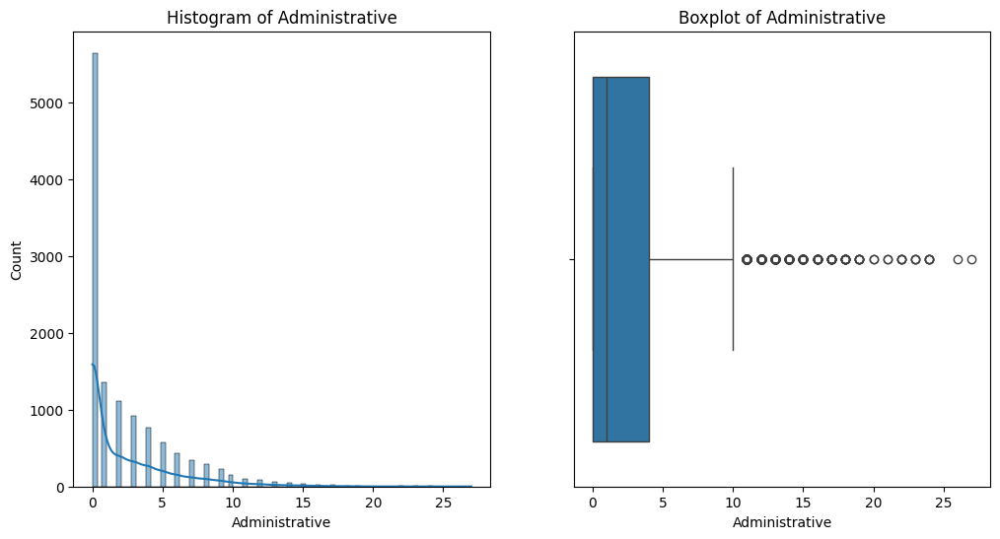

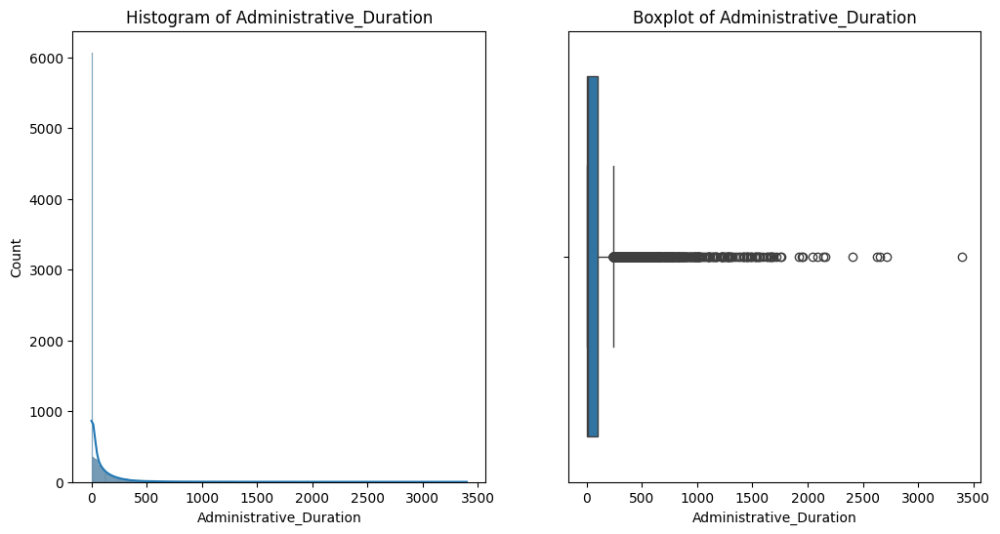

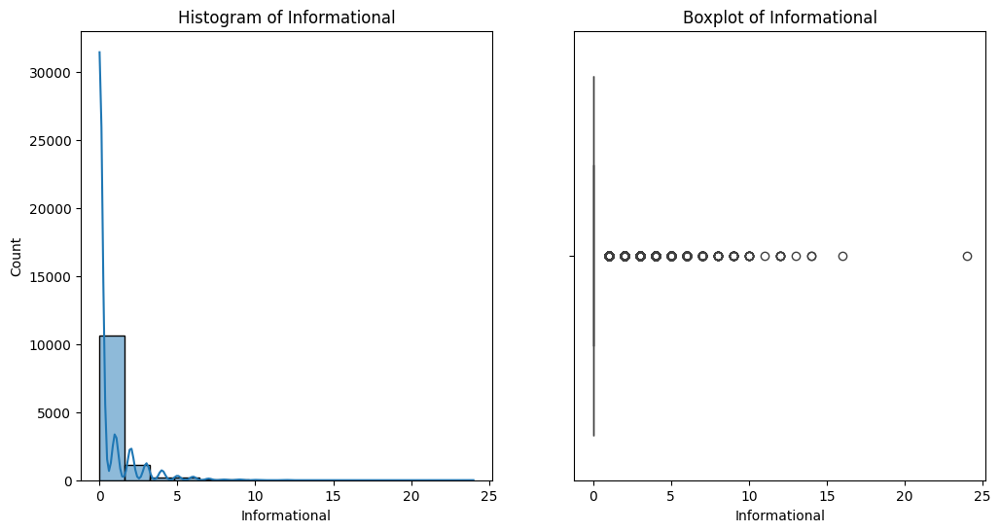

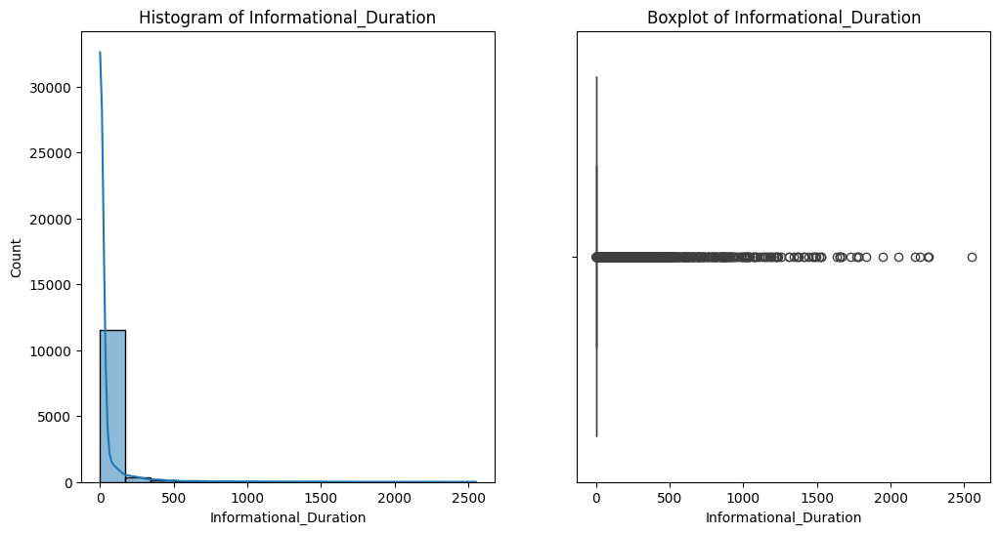

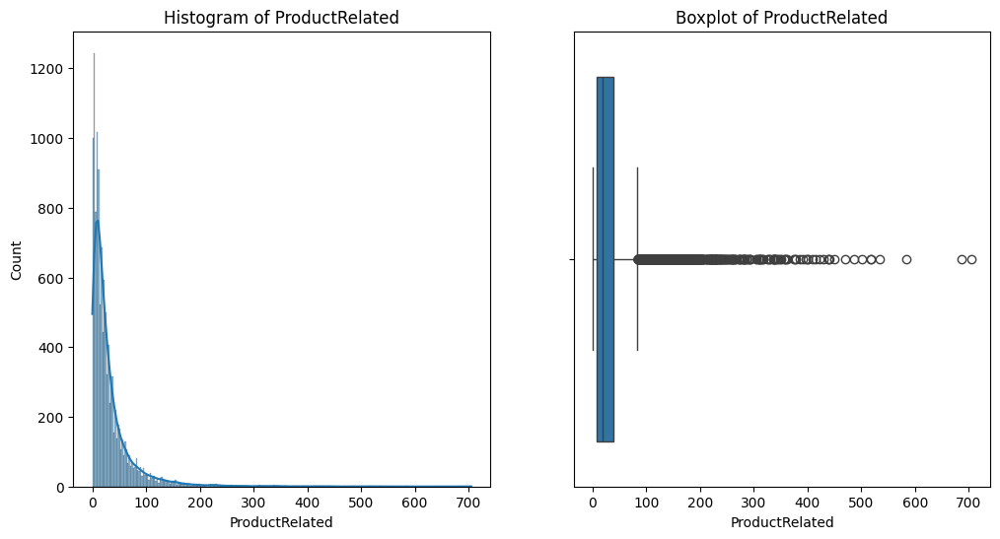

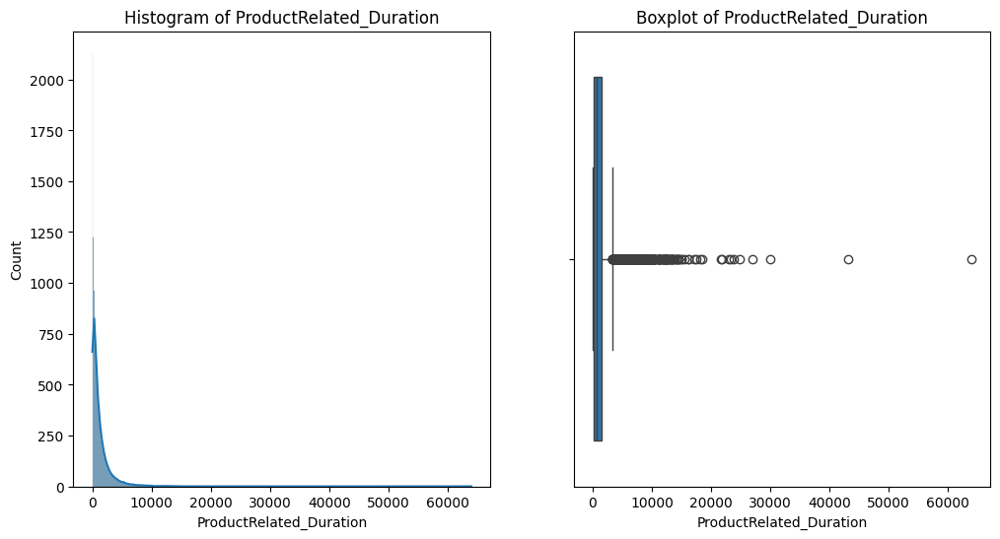

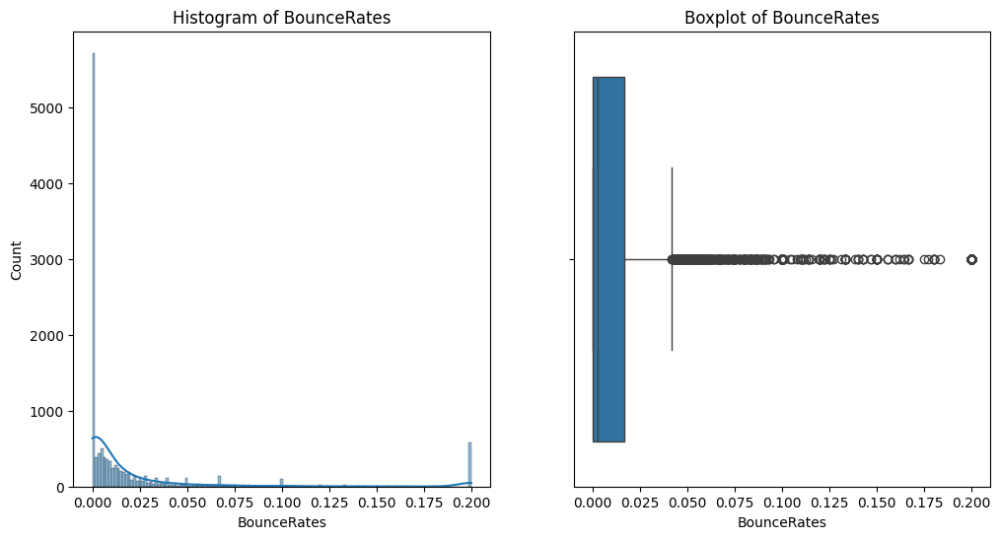

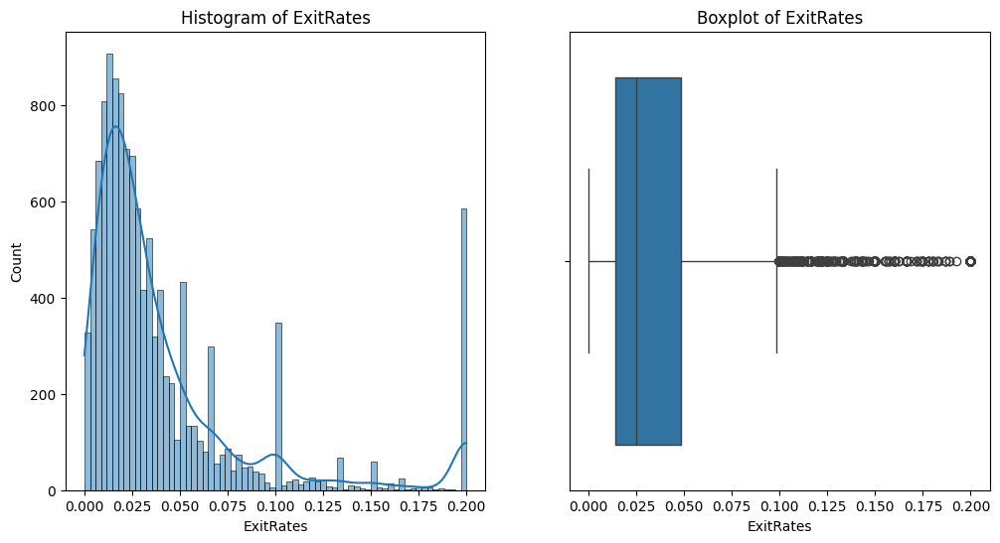

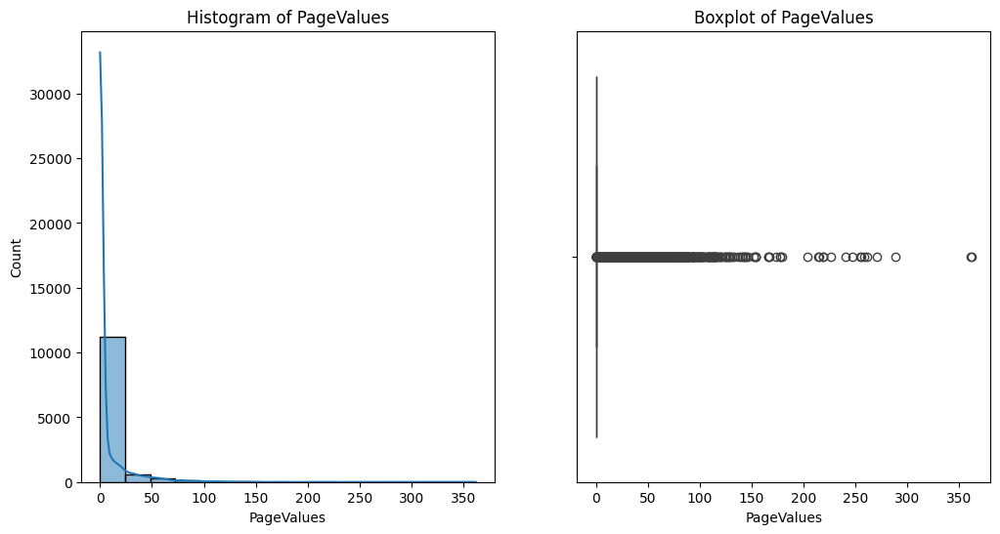

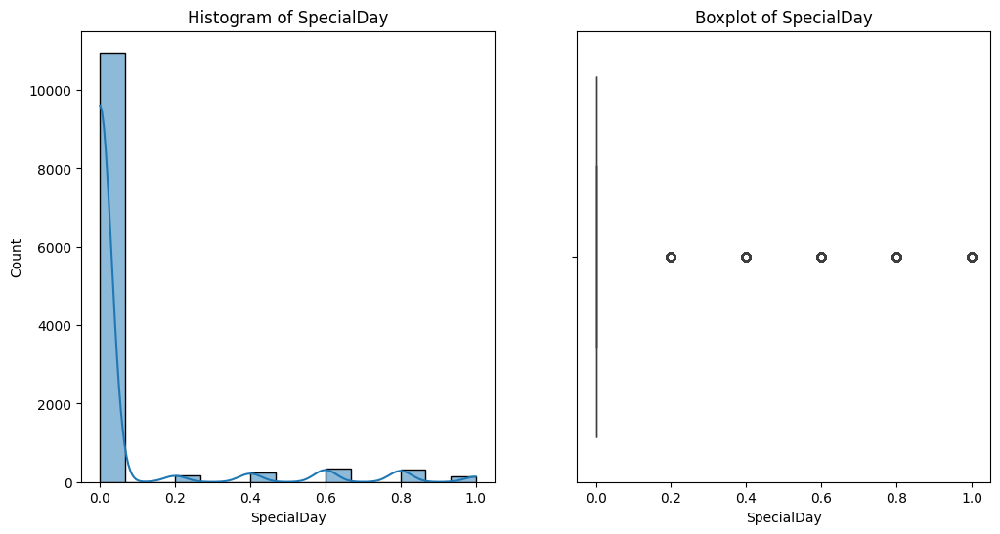

In [ ]:

for column in numerical_data:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram of {column}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot of {column}')


From the histograms and boxplots, it is clear that all numerical features are positively skewed and has outliers.

In [ ]:
data[numerical_data].skew()

,0
Administrative,1.947123
Administrative_Duration,5.592152
Informational,4.014173
Informational_Duration,7.540291
ProductRelated,4.333419
ProductRelated_Duration,7.253161
BounceRates,3.162425
ExitRates,2.234645
PageValues,6.350983
SpecialDay,3.285902


Here, we have highly skewed data with severe outliers (as seen in the skewness values).

✅ **Best Choice: Winsorization**

Since the data is skewed, Z-score is not suitable (it assumes normal distribution).
IQR can remove too many values, leading to data loss.
Winsorization keeps all data points but reduces the impact of extreme values by capping them.
For our dataset, Winsorization (capping extreme outliers) is the best choice before handling skewness
Winsorization replaces extreme values instead of removing them, capping them at a certain percentile (e.g., 99th percentile). This helps retain key user behavior patterns while reducing the effect of extreme values on summary statistics and machine learning models.

Thus, Winsorization is the best choice for this dataset as it handles extreme values without discarding valuable information, ensuring a more reliable analysis.

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats.mstats import winsorize



# Select only numerical columns
numeric_cols = data[numerical_data].columns

# Print skewness BEFORE handling outliers
print(" Skewness BEFORE handling outliers:")
print(data[numeric_cols].skew())

# Step 1: Handle Outliers using Winsorization
def winsorize_outliers(column):
    return winsorize(column, limits=[0.01, 0.01])  # Capping at 1st and 99th percentiles

# Apply Winsorization only to numerical columns
for col in numerical_data:
    data[col] = winsorize_outliers(data[col])

# Print skewness AFTER handling outliers
print("\nSkewness AFTER handling outliers:")
print(data[numerical_data].skew())

 Skewness BEFORE handling outliers:
Administrative             1.947123
Administrative_Duration    5.592152
Informational              4.014173
Informational_Duration     7.540291
ProductRelated             4.333419
ProductRelated_Duration    7.253161
BounceRates                3.162425
ExitRates                  2.234645
PageValues                 6.350983
SpecialDay                 3.285902
dtype: float64

Skewness AFTER handling outliers:
Administrative             1.640874
Administrative_Duration    3.078733
Informational              2.830675
Informational_Duration     4.759528
ProductRelated             2.608845
ProductRelated_Duration    2.582091
BounceRates                3.162425
ExitRates                  2.235722
PageValues                 3.490609
SpecialDay                 3.285902
dtype: float64


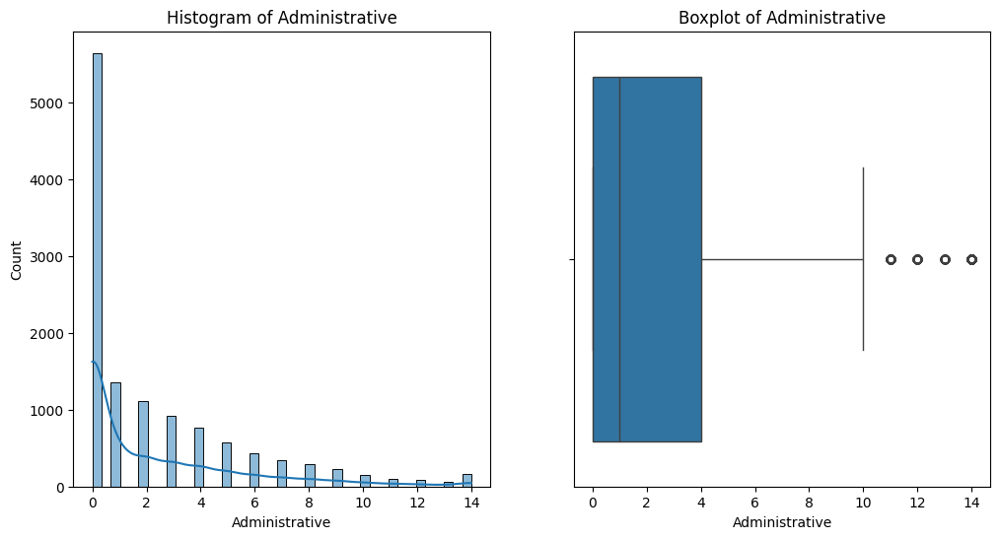

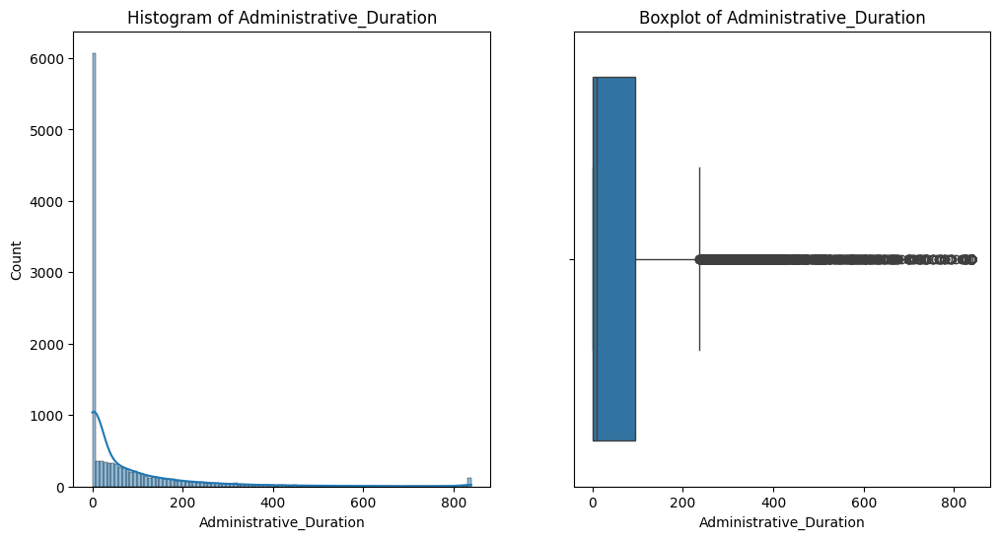

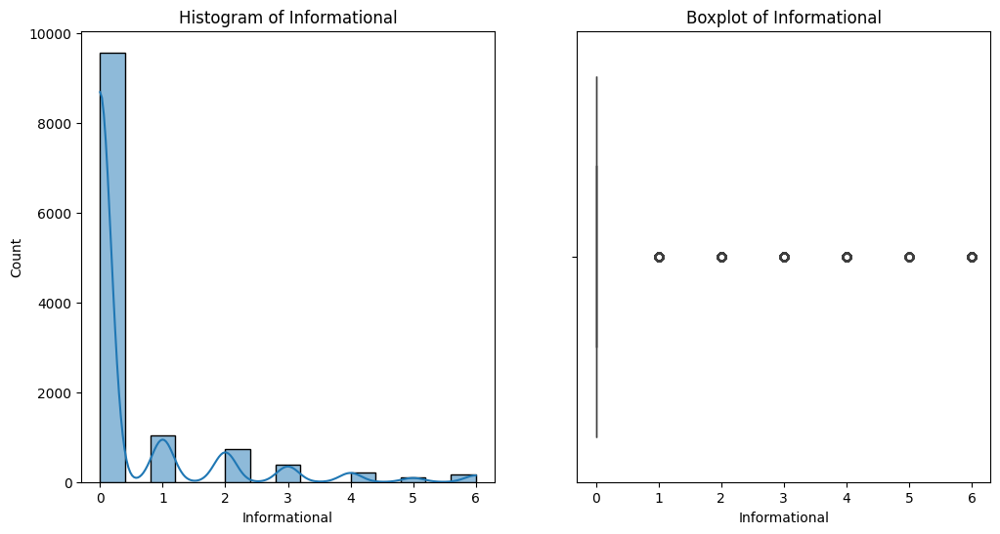

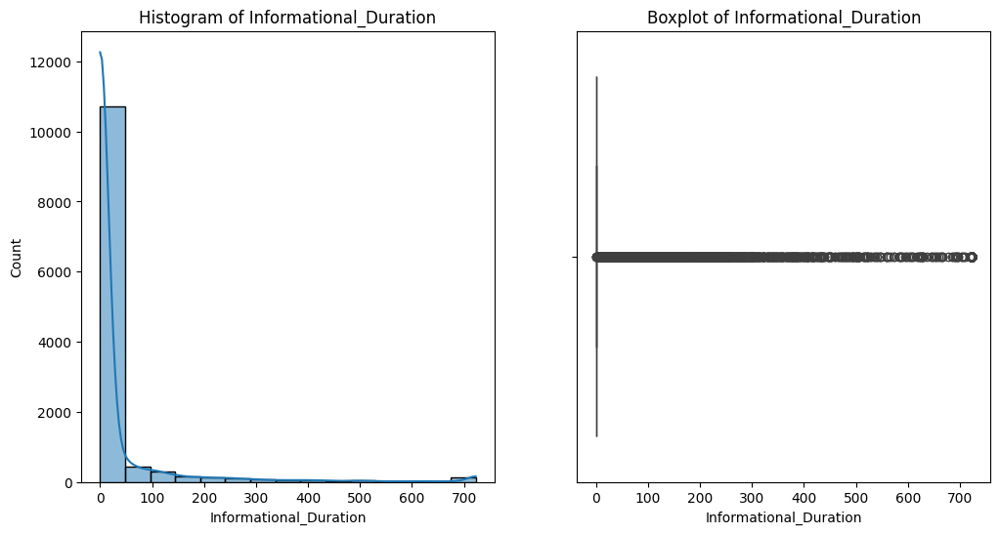

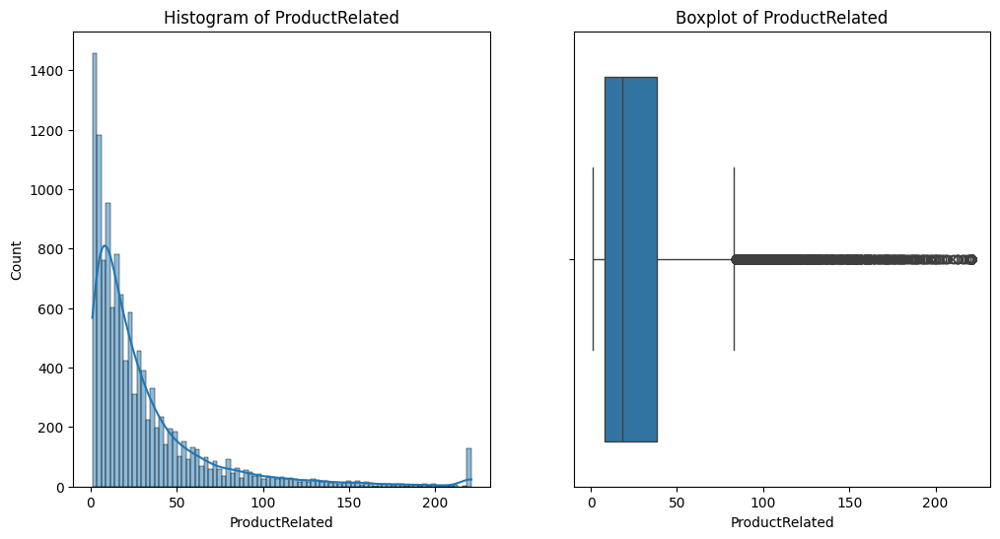

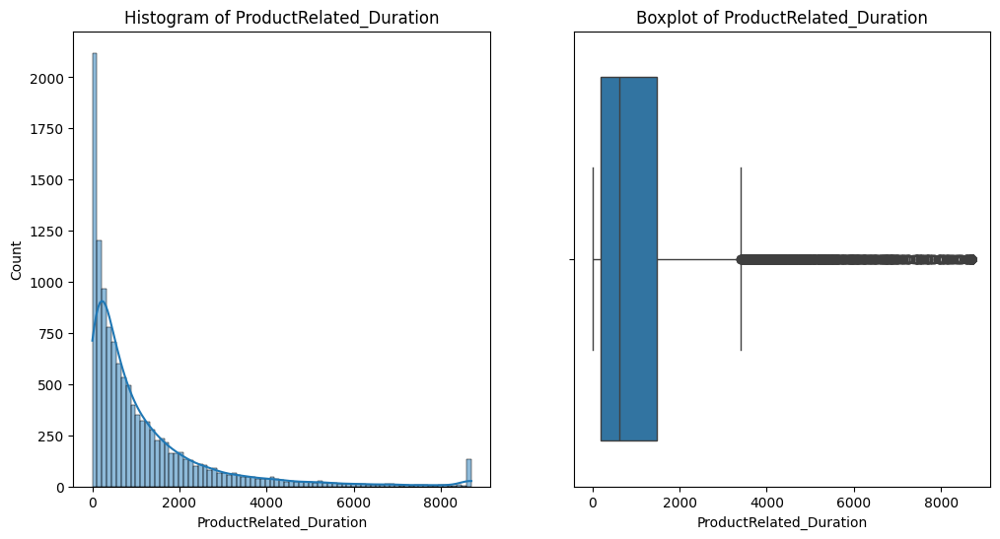

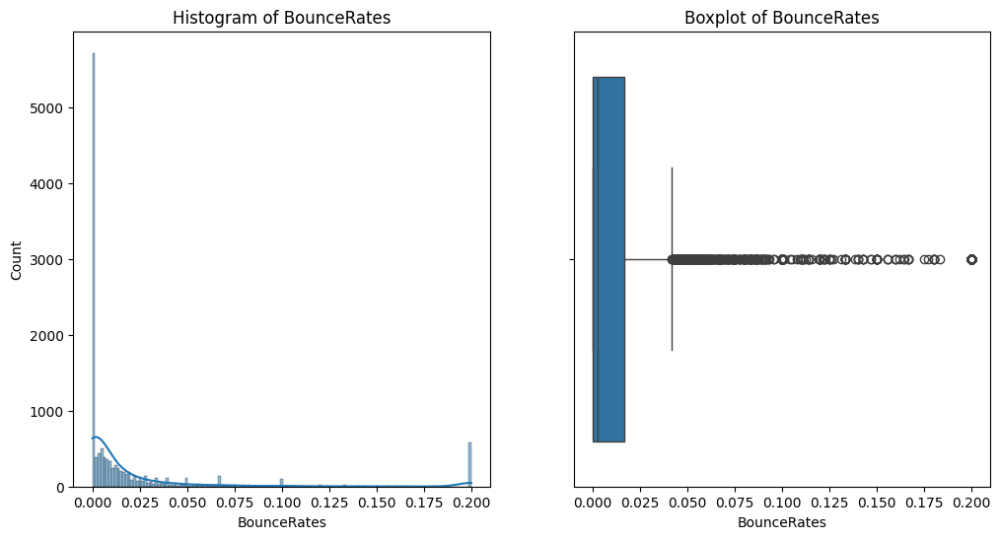

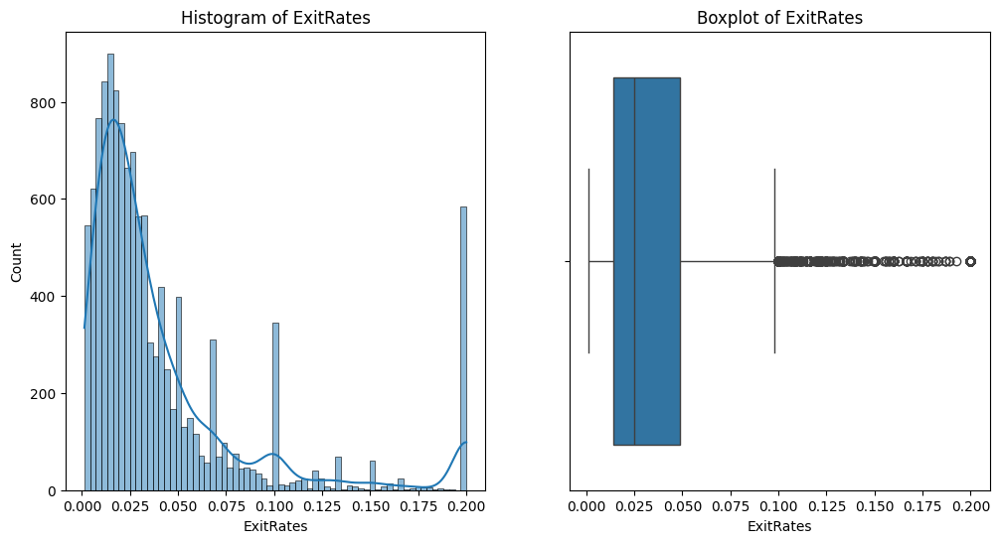

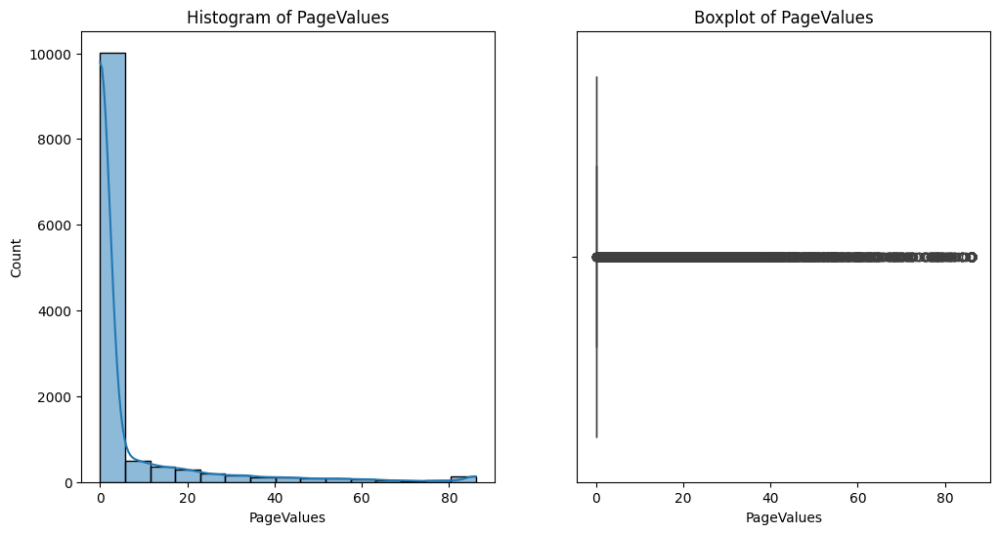

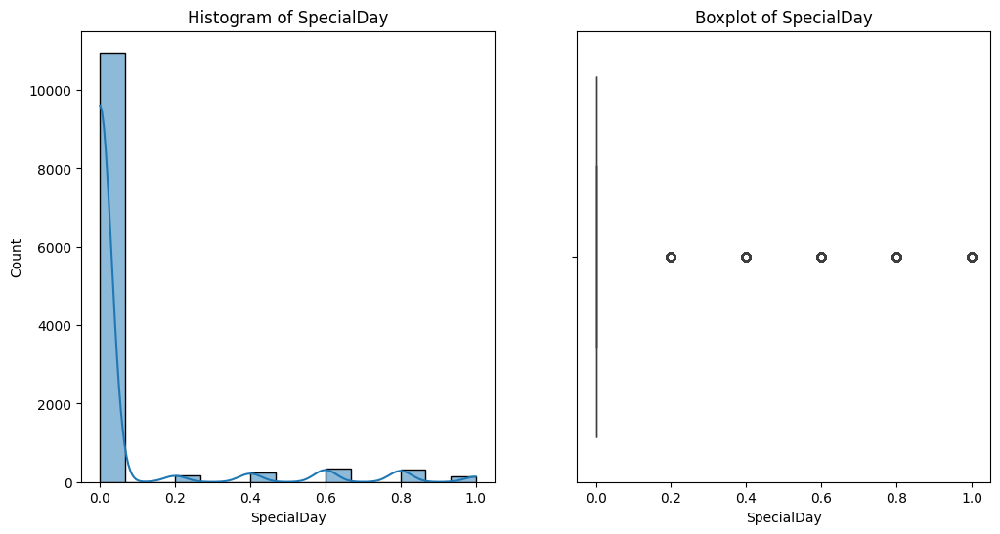

In [ ]:

# Loop through each numerical column and plot histogram + boxplot


for column in numerical_data:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram of {column}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

Winsorization reduced skewness in most numerical columns but not effectively.

After Winsorization, we need to further reduce skewness using an appropriate transformation. The choice of transformation depends on the level of skewness and the nature of the data.

Here, we used, **Yeo-Johnson transformation** because it works well with both positive and zero values, unlike log and square root transformations, which require strictly positive numbers. Since the features like ProductRelated_Duration data is highly skewed, simple transformations like log and square root may not be enough to make it look normal. Yeo-Johnson automatically adjusts based on the data, making it more flexible and effective in reducing skewness. This helps improve the accuracy of statistical models and ensures better data interpretation.

In [ ]:
from sklearn.preprocessing import PowerTransformer
# Step 2: Apply Yeo-Johnson Transformation
pt = PowerTransformer(method='yeo-johnson')  # Initialize transformer

# Fit and transform the numerical columns
data_cleaned = pt.fit_transform(data[numeric_cols])

# Convert back to DataFrame
data_cleaned = pd.DataFrame(data_cleaned, columns=numeric_cols)

# Print skewness AFTER Yeo-Johnson transformation
print("\n Skewness AFTER Yeo-Johnson transformation:")
print(data_cleaned.skew())



 Skewness AFTER Yeo-Johnson transformation:
Administrative             0.231978
Administrative_Duration    0.130233
Informational              1.388355
Informational_Duration     1.531092
ProductRelated            -0.004185
ProductRelated_Duration   -0.053732
BounceRates                1.011028
ExitRates                  0.414713
PageValues                 1.361982
SpecialDay                 2.624728
dtype: float64


After applying the Yeo-Johnson transformation, most features show a significant reduction in skewness, indicating a more normal-like distribution.  ProductRelated and ProductRelated_Duration have skewness values close to zero, suggesting they are now nearly symmetric, improving the reliability of statistical analyses. Administrative and Administrative_Duration also show minimal skewness, making them well-suited for modeling. However, Informational, Informational_Duration, BounceRates, and PageValues still exhibit moderate skewness and SpecialDay still remains highly skewed. Overall, the transformation has effectively improved data normality, which will enhance model performance and interpretation.So,proceeding to furthur actions

In [ ]:
# Select categorical columns from original dataset
categorical_cols = ['OperatingSystems', 'Browser', 'Region', 'TrafficType',
                    'Month', 'VisitorType', 'Weekend','Revenue']

# Merge categorical columns with cleaned numerical data
data_final = pd.concat([data_cleaned, data[categorical_cols].reset_index(drop=True)], axis=1)


# Check if the categorical columns are added
print("Columns in final dataset:", data_final.columns)


Columns in final dataset: Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Month',
       'VisitorType', 'Weekend', 'Revenue'],
      dtype='object')


#**6. Exploratory Data Analysis (EDA):**

**Countplot for categorical variables**

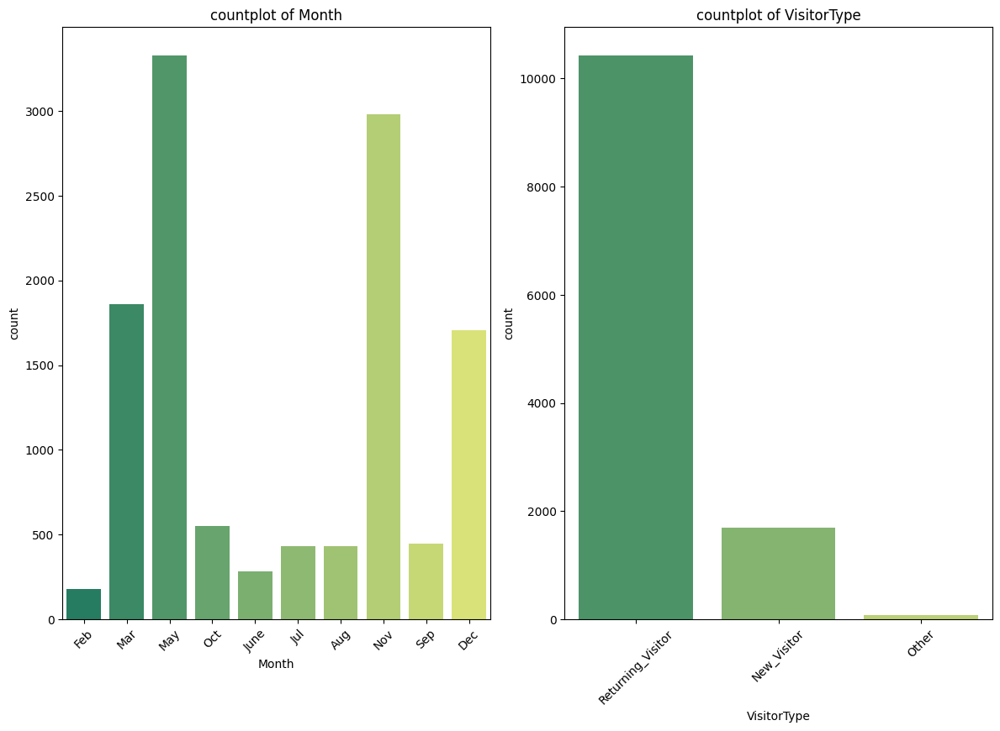

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

#select categorical columns
categorical_columns = data_final.select_dtypes("object").columns

#Set Figure size
plt.figure(figsize = (12,16))

# Loop through each categorical column and create countplots
for i,col in enumerate(categorical_columns,1):
  #create subplot
  plt.subplot(len(categorical_columns),2,i)
  sns.countplot(x=data_final[col],hue = data_final[col],palette = "summer")
  plt.xticks(rotation = 45)
  plt.title(f'countplot of {col}')
  plt.tight_layout()

**Insights from Countplots**

 Month-wise Distribution (Left Plot)

* May and November have the highest number of visitors.

* February has the least number of visitors.



 Visitor Type Distribution (Right Plot)

* Returning Visitors dominate, significantly higher than New Visitors.

* New Visitors are much fewer, and Other category is negligible.

* Indicates that most interactions come from users who have previously visited.

**Histogram for Numerical Variables**

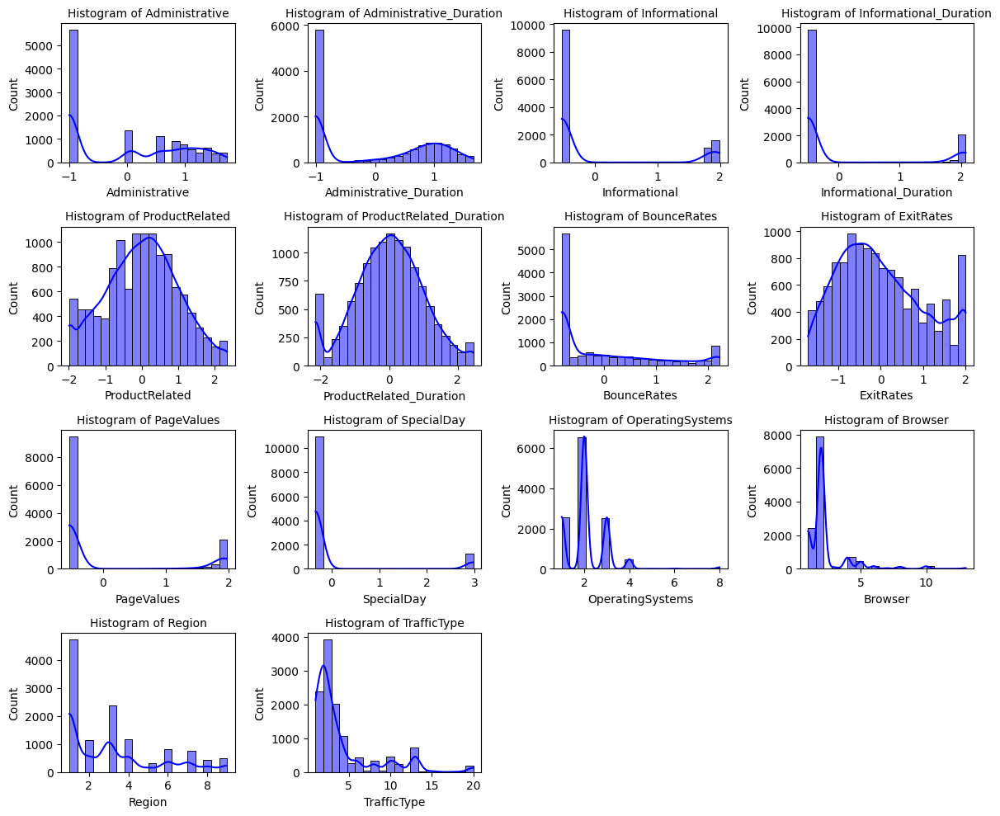

In [ ]:
#select numerical columns
numerical_columns = data_final.select_dtypes("number").columns

#set figure size
plt.figure(figsize = (12,10))

#Loop through each numerical column to create histograms
for i,col in enumerate(numerical_columns,1):
  plt.subplot(4,4,i)
  sns.histplot(data_final[col],bins=20,kde=True,color="blue")
  plt.title(f'Histogram of {col}',fontsize =10)

plt.tight_layout()
plt.show()


**Bivariate** **visualizations**


**1. Bar Plot: Relationship Between Visitor Type and Product Related Duration**

Objective:
Understanding how long different visitor types engage with product-related pages.

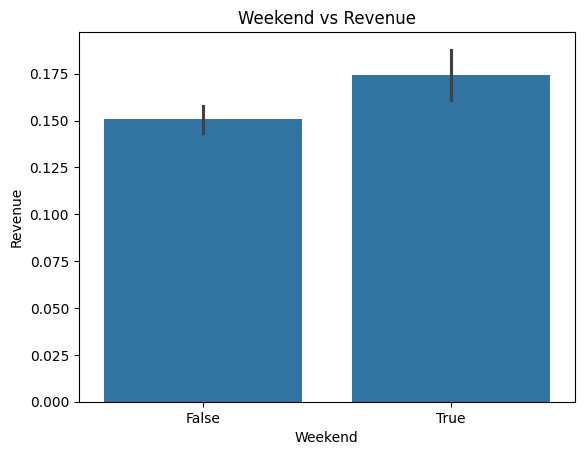

In [ ]:
#data_final["ProductRelated_Duration"] = data_final["ProductRelated_Duration"].abs()

sns.barplot(x="Weekend",y="Revenue",data = data_final)
plt.title("Weekend vs Revenue")
plt.xlabel("Weekend")
plt.ylabel("Revenue")
plt.show()

**Insights**

Here are the main insights from the graph:

* The revenue generated on weekends (True) is higher than on weekdays (False).

* This suggests that more users complete purchases during weekends.

* The difference between weekdays and weekends is noticeable but not extreme.





2. **Scatter Plot: Numerical vs Numerical**

 **Visualizing the relationship between ExitRates and BounceRates.**

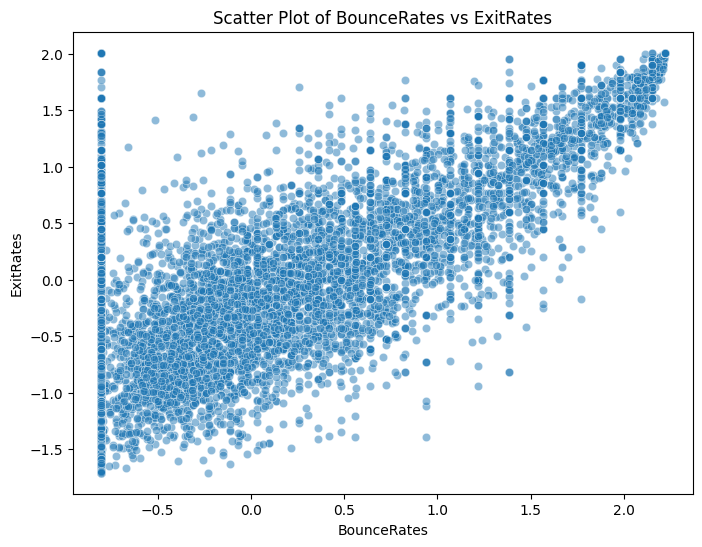

In [ ]:
plt.figure(figsize =(8,6))
sns.scatterplot(x = "BounceRates", y = "ExitRates", data = data_final,alpha = 0.5)
plt.title("Scatter Plot of BounceRates vs ExitRates")
plt.show()

 **Insights from the Scatter Plot (BounceRates vs ExitRates)**

1. Positive Correlation:

As BounceRates increase, ExitRates also tend to increase.
This suggests that when users leave a webpage immediately (high Bounce Rate), they also have a high likelihood of exiting the website.

2. Dense Cluster in the Middle:

Most data points are concentrated around 0.05 to 0.15 for both BounceRates and ExitRates, indicating that these values are common in the dataset.

3. Vertical Line at 0.0 BounceRates:

There are many points where BounceRates = 0.0, meaning some visitors don’t bounce at all but still contribute to ExitRates.
This could indicate pages with engaging content that retain users but still eventually lead to exits.

4. Identifying Problematic Pages:

Pages with very high Bounce and Exit Rates might indicate poor content, slow loading, or lack of engagement.

**3. Pie Chart: Proportion of Visitor Types**

**Objective:**
Understand the distribution of returning vs. new visitors.

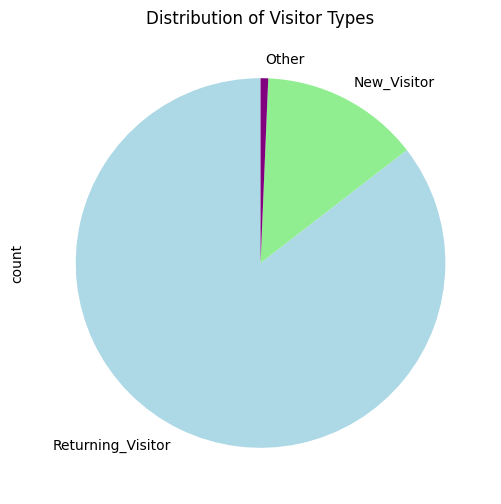

In [ ]:
data_final['VisitorType'].value_counts().plot(kind='pie',  figsize=(6, 6), startangle=90, colors=["lightblue", "lightgreen","purple"])
plt.title("Distribution of Visitor Types")
plt.show()


**Insights from the Pie Chart of Visitor Types:**

* Returning Visitors Dominate

The majority of visitors are Returning Visitors (largest portion of the pie chart).
This suggests a strong customer retention rate, meaning many users revisit the website.

* New Visitors Form a Smaller Share

New Visitors make up a smaller portion of total visits.
This indicates that while new users are coming in, they are significantly fewer compared to returning users.

* Other Visitors Are Minimal

The "Other" category is barely visible in the chart.
This suggests that very few users do not fit into the Returning or New Visitor categories.

* Business Implications:

The website is successful in retaining customers, which is a positive sign.
Efforts should be made to attract more new visitors through marketing campaigns or SEO strategies.

 4. **Pair Plot: Relationship Between Bounce Rates, Exit Rates, Page Values, and Revenue**

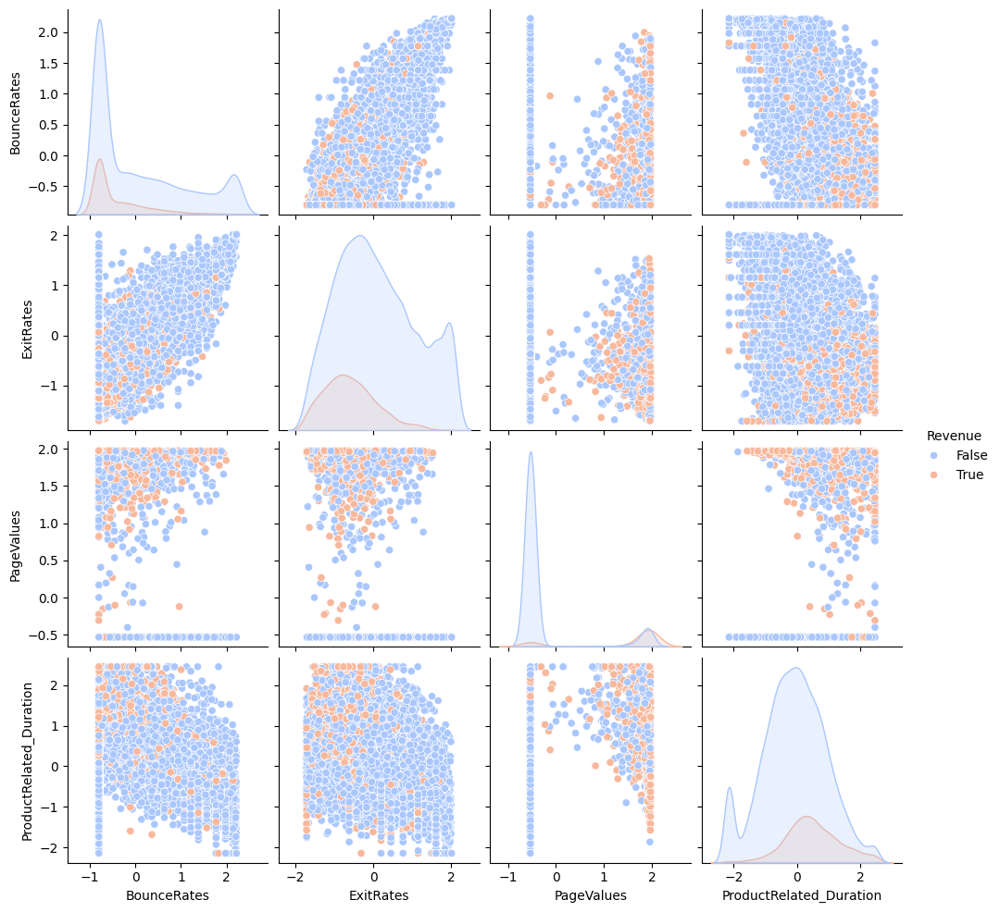

In [ ]:

sns.pairplot(data_final[['BounceRates', 'ExitRates', 'PageValues', 'ProductRelated_Duration', 'Revenue']], hue='Revenue', palette="coolwarm")
plt.show()


**Insights from pairplot**

These pairplots show relationships between several numerical variables, with colors indicating the categorical variable "Revenue" (True/False). Below are some key observations:

1. BounceRates vs. ExitRates

* There is a positive correlation between BounceRates and ExitRates, meaning that as one increases, the other tends to increase.
* Users who did not generate revenue (False) tend to have higher BounceRates and ExitRates, indicating they leave the site quickly without making a purchase.

2. PageValues

* PageValues are almost constant or very low for most data points.
* Visitors who contribute to revenue (True) tend to have slightly higher PageValues, suggesting that higher page engagement leads to sales.

3. ProductRelated_Duration vs. ExitRates / BounceRates

* There is a negative trend between ProductRelated_Duration and BounceRates/ExitRates.
* Users who spent more time on product-related pages were less likely to bounce or exit, increasing the chances of making a purchase.

4. Density Distributions (Diagonal Plots)

* The kernel density estimates (KDE) indicate that revenue-generating users (True) are more concentrated in areas with lower BounceRates and ExitRates.
* Revenue-generating users also have slightly higher engagement in terms of ProductRelated_Duration.

**5. Correlation Heatmap: Identifying Strong Relationships Between Variables**

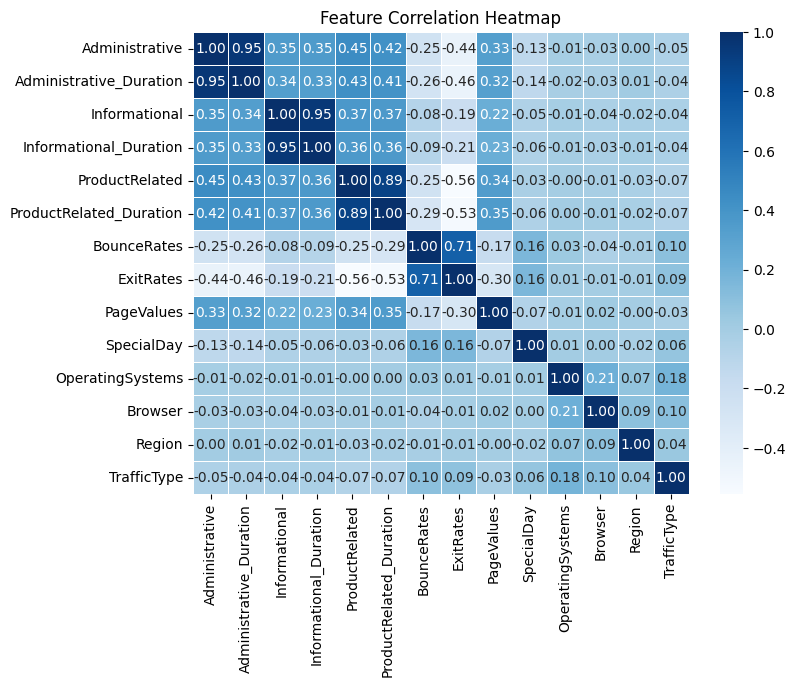

In [ ]:

plt.figure(figsize=(8,6))
sns.heatmap(data=data_final.select_dtypes("number").corr(),
            annot=True,
            cmap='Blues',
            fmt=".2f",
            linewidths=0.5)

plt.title("Feature Correlation Heatmap")
plt.show()

**Key Insights from the Heatmap:**
From the correlation heatmap,we can see that some variables have a high correlation (above 0.90), indicating multicollinearity issues. Specifically:

Key Observations:
Administrative (0.95) ↔ Administrative_Duration → Strong correlation.

Informational (0.95) ↔ Informational_Duration → Strong correlation.

When two features are highly correlated (above 0.90), they provide redundant information, which can distort model interpretations and lead to overfitting.

Since Administrative and Administrative_Duration are strongly correlated (0.95), keeping both adds unnecessary complexity. We can drop one.

Similarly, Informational and Informational_Duration provide overlapping information, so one can be removed.


In [ ]:
data_final.drop(columns=['Administrative_Duration','Informational_Duration'], inplace=True)


 **6. Violin Plot: Categorical vs Numerical**
This plot shows the distribution of Bounce Rate for each VisitorType.

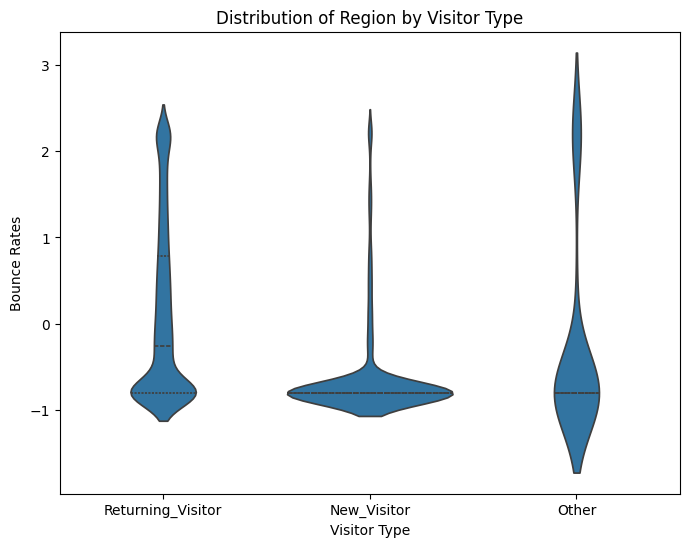

In [ ]:
plt.figure(figsize=(8, 6))
sns.violinplot(x='VisitorType', y='BounceRates', data=data_final, inner='quartile')
plt.title("Distribution of Region by Visitor Type")
plt.xlabel("Visitor Type")
plt.ylabel("Bounce Rates")
plt.show()


**Key Insights fro violin Graph**

Key Insights:

1. Returning Visitors:

* Most returning visitors have low bounce rates, but there is a notable proportion with higher bounce rates (~0.15-0.2).

* Returning visitors may engage more but some still bounce quickly.

2. New Visitors:

* The distribution is narrow and concentrated around zero bounce rate.
* This indicates low variation, meaning most new visitors either bounce immediately or engage at a very consistent rate.
* If bounce rates are very low, it might suggest effective landing pages for first-time users.

3. Other Visitors:

* The distribution is widely spread and shows a long upper tail (bounce rates extending beyond 0.2).
* A significant proportion of these visitors have high bounce rates, indicating potential disinterest or irrelevant traffic.


 **7. Box Plot:  Monthly Distribution of ProductRelated_Duration**

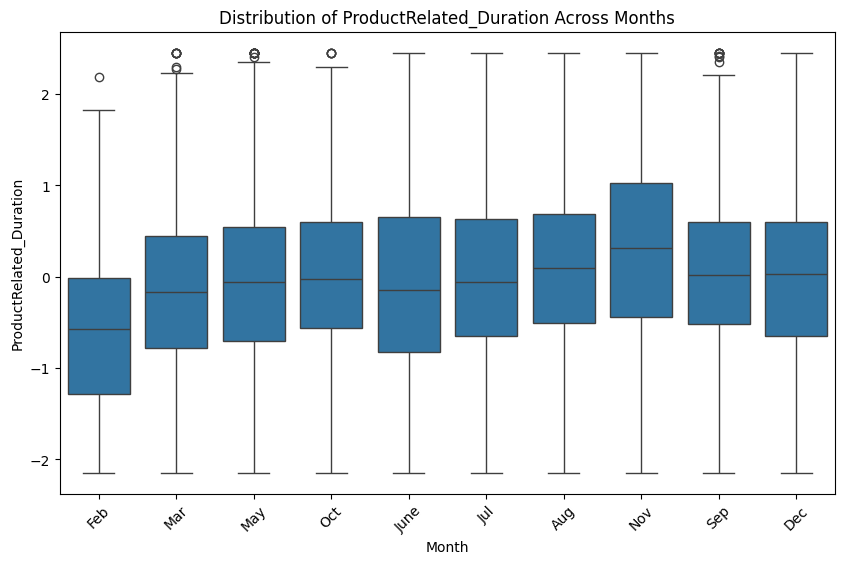

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x="Month", y="ProductRelated_Duration", data=data_final)
plt.title("Distribution of ProductRelated_Duration Across Months")
plt.xlabel("Month")
plt.ylabel("ProductRelated_Duration")
plt.xticks(rotation=45)
plt.show()


**Insights from the Box Plot of ProductRelated_Duration Across Months**


1. Spread & Distribution

The median (central line in boxes) is relatively stable across months.
Most months have a similar interquartile range (IQR), meaning product-related browsing time does not vary drastically.

2. Outliers

Some months (e.g., March, May, September) have several outliers at the top, indicating users with exceptionally high product-related durations.
The whiskers extend to different levels, suggesting that the browsing time for some users fluctuates significantly.

3. Comparison Across Months

November appears to have a slightly higher median and upper quartile, possibly due to holiday shopping trends (Black Friday, Cyber Monday).
February shows a lower median and a smaller IQR, implying relatively lower engagement with product pages.

# **7. Feature Engineering**

Feature Engineering is the process of transforming raw data into meaningful features that improve the performance of a machine learning model. It involves creating new features, modifying existing ones, and selecting the most relevant features to enhance predictive power.

# **Checking Correlation**


In [ ]:
num_features = data_final.select_dtypes(include=["number"])
num_features

,Administrative,Informational,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
0,-0.998636,-0.523872,-1.984371,-2.144105,2.219446,2.010392,-0.532843,-0.33763,1,1,1,1
1,-0.998636,-0.523872,-1.630657,-1.126160,-0.802948,1.611245,-0.532843,-0.33763,2,2,1,2
2,-0.998636,-0.523872,-1.984371,-2.144105,2.219446,2.010392,-0.532843,-0.33763,4,1,9,3
3,-0.998636,-0.523872,-1.630657,-1.927441,1.772681,1.867070,-0.532843,-0.33763,3,2,2,4
4,-0.998636,-0.523872,-0.474783,0.033446,0.827019,0.763537,-0.532843,-0.33763,3,3,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12200,0.834997,-0.523872,0.988439,0.817872,-0.068325,0.018313,1.918153,-0.33763,4,6,1,1
12201,-0.998636,-0.523872,-1.018306,-0.156656,-0.802948,-0.356468,-0.532843,-0.33763,3,2,1,8
12202,-0.998636,-0.523872,-0.880794,-0.667911,2.089475,1.465735,-0.532843,-0.33763,3,2,1,13
12203,1.029687,-0.523872,-0.134994,-0.333111,-0.802948,-0.371414,-0.532843,-0.33763,2,2,3,11


In [ ]:
 # Compute correlation matrix
corr_matrix = num_features.corr()
corr_matrix

,Administrative,Informational,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
Administrative,1.000000,0.354911,0.452116,0.417405,-0.251437,-0.443488,0.330537,-0.129574,-0.014386,-0.026472,0.003895,-0.046359
Informational,0.354911,1.000000,0.368508,0.366417,-0.081461,-0.194000,0.222457,-0.053712,-0.010252,-0.035228,-0.020912,-0.036947
ProductRelated,0.452116,0.368508,1.000000,0.894382,-0.249254,-0.555375,0.344867,-0.029314,-0.004080,-0.014781,-0.034252,-0.070223
ProductRelated_Duration,0.417405,0.366417,0.894382,1.000000,-0.294007,-0.530219,0.352962,-0.056928,0.003590,-0.007351,-0.023018,-0.067094
BounceRates,-0.251437,-0.081461,-0.249254,-0.294007,1.000000,0.709802,-0.173347,0.156786,0.028990,-0.042476,-0.014740,0.099860
ExitRates,-0.443488,-0.194000,-0.555375,-0.530219,0.709802,1.000000,-0.298382,0.160210,0.010622,-0.006085,-0.006185,0.086076
PageValues,0.330537,0.222457,0.344867,0.352962,-0.173347,-0.298382,1.000000,-0.068774,-0.008757,0.016030,-0.004691,-0.027001
SpecialDay,-0.129574,-0.053712,-0.029314,-0.056928,0.156786,0.160210,-0.068774,1.000000,0.008089,0.003674,-0.021582,0.059465
OperatingSystems,-0.014386,-0.010252,-0.004080,0.003590,0.028990,0.010622,-0.008757,0.008089,1.000000,0.212335,0.071864,0.183074
Browser,-0.026472,-0.035228,-0.014781,-0.007351,-0.042476,-0.006085,0.016030,0.003674,0.212335,1.000000,0.092038,0.102868


## **Variance Inflation Factor (VIF)**
VIF measures how much a feature is affected by other features.

* VIF > 10 → Strong collinearity (remove the feature)
* VIF < 5 → No serious collinearity
* 5>VIF<10 - moderate collinearity

Note : Using add_constant ensures that the intercept is included in the VIF calculation, which can give more accurate results.



In [ ]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Select only numerical features
numerical_features = data_final.select_dtypes("number")
# Add constant column
X = sm.add_constant(numerical_features)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


                    Feature       VIF
0                     const  8.747300
1            Administrative  1.479471
2             Informational  1.244641
3            ProductRelated  5.757651
4   ProductRelated_Duration  5.242234
5               BounceRates  2.216500
6                 ExitRates  3.092709
7                PageValues  1.213222
8                SpecialDay  1.048510
9          OperatingSystems  1.081412
10                  Browser  1.064923
11                   Region  1.014999
12              TrafficType  1.055054


Here, all the features have moderate or not strong multicollinearity


Identify data types

In [ ]:
data_final.dtypes

,0
Administrative,float64
Informational,float64
ProductRelated,float64
ProductRelated_Duration,float64
BounceRates,float64
ExitRates,float64
PageValues,float64
SpecialDay,float64
OperatingSystems,int64
Browser,int64


#**Encoding Categorical Features**

* Categorical features represent discrete groups or categories, even when encoded as numbers (like OperatingSystems, Browser).

* Numerical features represent measurements or counts that can take any value within a range.

* Some features like OperatingSystems appear to be categorical despite being stored as numbers - they're likely encoding specific categories.



For the online shopping dataset, several categorical features should be encoded before modeling. OperatingSystems, Browser, Region, and TrafficType should be one-hot encoded because these numeric values represent distinct categories without inherent ordinal relationships – using them as raw numbers would falsely imply mathematical relationships between categories .

Month and VisitorType alsoshould be  one-hot encoded".The binary features Weekend and Revenue can be simply label-encoded to 0/1 value

## (a) Label encoding for Binary Data

* Weekend is a binary categorical variable (True/False), which can be directly mapped to 0 or 1.
* Revenue (target variable) is also binary (True/False), so it can be encoded as 0 or 1.


## (b) One-Hot Encoding for Nominal Data

One-Hot Encoding creates a new binary column for each unique category. We apply it to Month and VisitorType.

In [ ]:
import pandas as pd

# Copy the original cleaned data to avoid modifying it directly
data_encoded = data_final.copy()

# Convert binary features directly to integers (0/1)
data_encoded["Weekend"] = data_encoded["Weekend"].astype(int)
data_encoded["Revenue"] = data_encoded["Revenue"].astype(int)

# One-Hot Encode categorical features
cat_data_encoded = pd.get_dummies(data_encoded[['OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Month', 'VisitorType']], drop_first=True, dtype=int)

# Concatenate encoded categorical data without duplicating columns
data_encoded = pd.concat([data_encoded.drop(['OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Month', 'VisitorType'], axis=1),
                          cat_data_encoded], axis=1)

# Display results
print("Final Encoded DataFrame Columns:\n", data_encoded.columns)
print(data_encoded.head())


Final Encoded DataFrame Columns:
 Index(['Administrative', 'Informational', 'ProductRelated',
       'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues',
       'SpecialDay', 'Weekend', 'Revenue', 'OperatingSystems', 'Browser',
       'Region', 'TrafficType', 'Month_Dec', 'Month_Feb', 'Month_Jul',
       'Month_June', 'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct',
       'Month_Sep', 'VisitorType_Other', 'VisitorType_Returning_Visitor'],
      dtype='object')
   Administrative  Informational  ProductRelated  ProductRelated_Duration  \
0       -0.998636      -0.523872       -1.984371                -2.144105   
1       -0.998636      -0.523872       -1.630657                -1.126160   
2       -0.998636      -0.523872       -1.984371                -2.144105   
3       -0.998636      -0.523872       -1.630657                -1.927441   
4       -0.998636      -0.523872       -0.474783                 0.033446   

   BounceRates  ExitRates  PageValues  SpecialDay  W

In [ ]:
print("Revenue Value Counts:\n", data_encoded["Revenue"].value_counts())

Revenue Value Counts:
 Revenue
0    10297
1     1908
Name: count, dtype: int64


The dataset exhibits an imbalance in the "Revenue" classes, with 1,0297 instances labeled as FALSE (no purchase) and 1,908 instances labeled as TRUE (purchase). This imbalance may cause the model to be biased toward predicting the majority class. To address this issue and ensure a more balanced representation, SMOTE is applied to generate synthetic samples for the minority class.

**SMOTE (Synthetic Minority Over-sampling Technique)** is a method used to handle imbalanced datasets by generating synthetic samples for the minority class (underrepresented category). It helps machine learning models learn better patterns instead of just predicting the majority class.




# **8.Split Data into Training and Testing Sets:**

A train-test split should always be performed before applying SMOTE to avoid data leakage. When SMOTE generates synthetic samples for the minority class, it uses information from existing data points. If applied to the entire dataset before splitting, synthetic samples created from test data would leak into the training set, causing the model to "see" information from the test set during training. This leads to overly optimistic performance metrics and a model that fails to generalize to truly unseen data.




In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Define features and target
x = data_encoded.drop(columns = ["Revenue"])
y = data_encoded["Revenue"]


# Split data before applying SMOTE (to avoid data leakage)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE only to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


# Check the new balance
print("Before SMOTE:", y_train.value_counts())
print("After SMOTE:", y_train_smote.value_counts())

Before SMOTE: Revenue
0    8238
1    1526
Name: count, dtype: int64
After SMOTE: Revenue
1    8238
0    8238
Name: count, dtype: int64


# **9. Feature Selection**

In [ ]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Define features (X) and target variable (y)
#X = data_encoded.drop(columns=["Revenue"])  # Features
#y = data_encoded["Revenue"]  # Target variable

# Split into training and testing sets (optional, but useful)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)

# Initialize Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train_smote, y_train_smote)

# Get feature importances
feature_importances = rf_model.feature_importances_

# Create DataFrame with feature scores
feature_scores = pd.DataFrame({
   "Feature": X_train_smote.columns,
   "Importance": feature_importances
})

# Sort by importance (highest first)
feature_scores = feature_scores.sort_values(by="Importance", ascending=False)

# Display the top features
print(feature_scores)


                          Feature  Importance
6                      PageValues    0.361162
5                       ExitRates    0.098835
0                  Administrative    0.083453
3         ProductRelated_Duration    0.076607
2                  ProductRelated    0.071014
4                     BounceRates    0.059671
12                    TrafficType    0.029344
11                         Region    0.028486
1                   Informational    0.027809
23  VisitorType_Returning_Visitor    0.021454
9                OperatingSystems    0.021268
18                      Month_May    0.019713
10                        Browser    0.017030
19                      Month_Nov    0.016662
17                      Month_Mar    0.014939
13                      Month_Dec    0.014421
8                         Weekend    0.010635
7                      SpecialDay    0.006837
15                      Month_Jul    0.005487
21                      Month_Sep    0.005473
20                      Month_Oct 

In [ ]:
# Set a threshold (example: 0.02)
threshold = 0.02

# Select features with importance above the threshold
selected_features = feature_scores[feature_scores['Importance'] > threshold]

print("Selected Features:")
print(selected_features)

# If you want to use the selected features for your dataset X
#X_selected = x[selected_features['Feature']]

#Apply Feature Selection to the SMOTE Dataset
X_train_smote = X_train_smote[selected_features['Feature']]
X_test = X_test[selected_features['Feature']]  # Apply same features to test data



Selected Features:
                          Feature  Importance
6                      PageValues    0.361162
5                       ExitRates    0.098835
0                  Administrative    0.083453
3         ProductRelated_Duration    0.076607
2                  ProductRelated    0.071014
4                     BounceRates    0.059671
12                    TrafficType    0.029344
11                         Region    0.028486
1                   Informational    0.027809
23  VisitorType_Returning_Visitor    0.021454
9                OperatingSystems    0.021268


In [ ]:
# Assuming 'Revenue' is the target variable (1 for purchase, 0 for no purchase)
#X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42, stratify=y)

# 10. **Feature Scaling**

Feature scaling ensures that numerical features have a uniform scale, preventing large-valued features from dominating models.

1.**Min-Max Scaling (Normalization)** → Scales values between 0 and 1

Best for: Algorithms like KNN, Neural Networks, Linear Regression, Logistic Regression, SVM

2. **Standardization (Z-score Normalization)** → Centers around mean 0 and standard deviation 1

Best for: Algorithms like SVM, PCA, K-Means, Gradient Descent-based models (e.g., Logistic Regression, Neural Networks)

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(X_train_smote)
x_test_scaled = scaler.transform(X_test)

# **11.Build ML Model**

The target variable is Revenue, which is binary (0 or 1):
0 → The user did not make a purchase.
1 → The user made a purchase.
Since we are predicting a categorical outcome (yes/no, 1/0), this is a binary classification problem.

**1. Logistic Regression**

* A statistical model used for binary classification (e.g., predicting Revenue as True/False).

* Simple and interpretable, useful if the dataset has a linear relationship between features and the target.

**2. Decision Tree**

* A tree-based model that splits data based on conditions to make predictions.

* Handles both numerical and categorical data, interpretable, but prone to overfitting.

**3. Random Forest**

* An ensemble of multiple decision trees that improves accuracy and reduces overfitting.
* Handles complex patterns well and is robust to missing data or noise.

**4. Gradient Boosting**

* An ensemble method that builds trees sequentially, improving predictions by correcting errors.
* More accurate than a single decision tree, good for non-linear relationships.

**5. XGBoost**

* An optimized version of gradient boosting, faster and more efficient with large datasets.
* Works well with imbalanced data, handles feature importance effectively.

In [ ]:
# Import Required Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier  # Import XGBoost
from sklearn.metrics import accuracy_score, classification_report

# Define models (Adding XGBoost)
models = {
    "Logistic Regression": LogisticRegression(),
    "Support Vector Machine": SVC(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XGBoost": XGBClassifier()
}

# Lists to store results
results = []

# Training models and storing results
for model_name, model in models.items():


    # Train the model
    model.fit(x_train_scaled, y_train_smote)

    # Training accuracy
    train_accuracy = model.score(x_train_scaled, y_train_smote)

    # Predict on test data
    y_predict = model.predict(x_test_scaled)

    # Testing accuracy
    test_accuracy = accuracy_score(y_test, y_predict)

    # Store results
    results.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "Classification Report": classification_report(y_test, y_predict)
    })





 # **12.Model Evaluation:**


In [ ]:
# Print results for all models
for res in results:
    print("\n====================================")
    print(f"Model: {res['Model']}")
    print(f"Training Accuracy: {res['Train Accuracy']:.4f}")
    print(f"Testing Accuracy: {res['Test Accuracy']:.4f}")
    print("Classification Report:\n", res["Classification Report"])
    print("====================================")



Model: Logistic Regression
Training Accuracy: 0.8475
Testing Accuracy: 0.8693
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.88      0.92      2059
           1       0.56      0.81      0.66       382

    accuracy                           0.87      2441
   macro avg       0.76      0.84      0.79      2441
weighted avg       0.90      0.87      0.88      2441


Model: Support Vector Machine
Training Accuracy: 0.8658
Testing Accuracy: 0.8669
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.92      2059
           1       0.55      0.84      0.66       382

    accuracy                           0.87      2441
   macro avg       0.76      0.85      0.79      2441
weighted avg       0.90      0.87      0.88      2441


Model: Decision Tree
Training Accuracy: 0.9999
Testing Accuracy: 0.8513
Classification Report:
               precision    recall  f1-sc

# **Insights from Model Performance**


1. Best Performing Model: XGBoost

* Testing Accuracy: 88.98% (highest among all models)
* Class Balance Handling: Recall for class 1 (65%) and class 0 (93%) is well-balanced.
* Less overfitting than Decision Tree & Random Forest
* Best Choice for Deployment due to high accuracy and balanced performance.

2. Ensemble Models (Gradient Boosting & Random Forest) Perform Well.

* Gradient Boosting: Testing accuracy 88.32%, strong recall (76%) for class 1.

* Random Forest: Testing accuracy 88.16%, but overfits with training accuracy at 99.99%.
* Key Strengths: Both models handle class imbalance better than simpler models and provide robust performance.

3. Logistic Regression & Support Vector Machine (SVM)
*  Show Similar Performance
* Testing Accuracy: Around 86.9% for both models.
8 Class Imbalance Issue: Recall for class 1 is lower (56% for logistic regression, 55% for SVM).
Use Case: Good for interpretability but not ideal for handling class imbalance in this dataset.

4. Decision Tree Struggles Due to Overfitting

* Training Accuracy: 99.99% (almost perfect, indicating overfitting).
* Testing Accuracy: 85.09% (lowest among all models).
* High Variance: The model learns the training data too well but fails to generalize to new data.
* Not Suitable for Deployment due to poor generalization.

In [ ]:
# Create a DataFrame for visualization
accuracy_df = pd.DataFrame({
    'Model': [res["Model"] for res in results],
    'Training Accuracy': [res["Train Accuracy"] for res in results],
    'Testing Accuracy': [res["Test Accuracy"] for res in results]
})


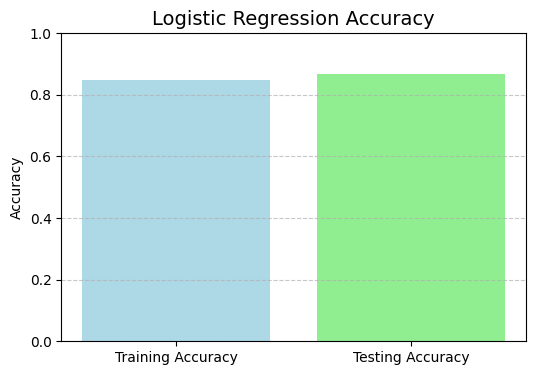

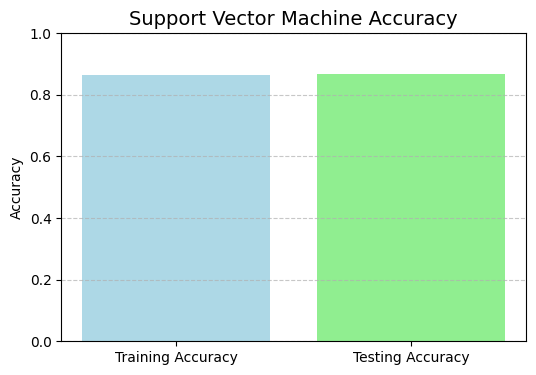

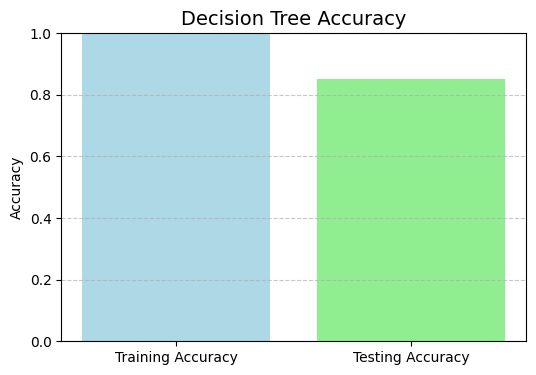

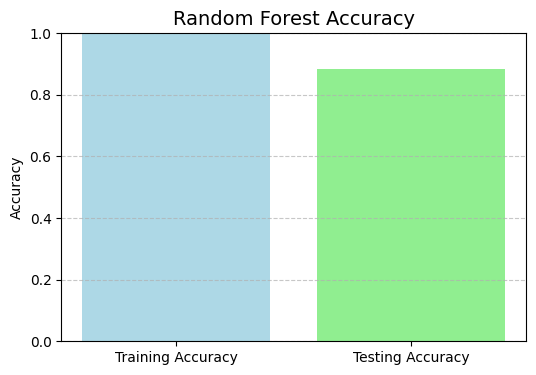

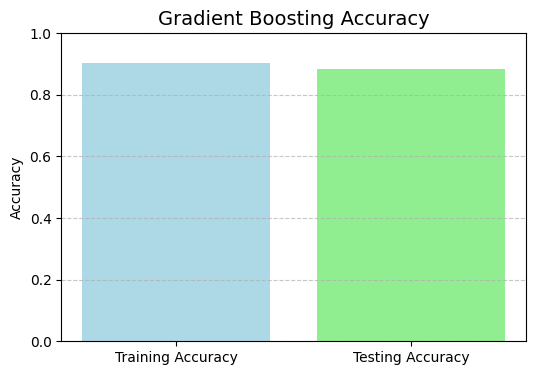

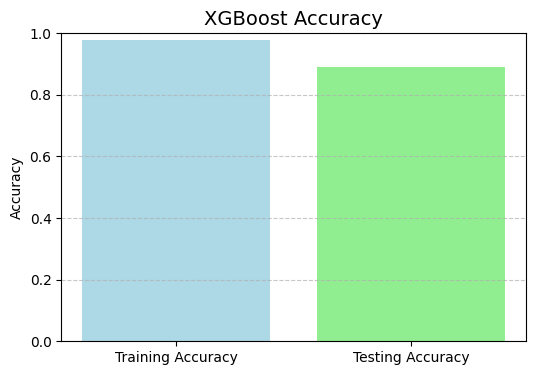

In [ ]:
for i, model_name in enumerate(accuracy_df["Model"]):
    plt.figure(figsize=(6, 4))

    # Get accuracy values
    train_acc = accuracy_df.loc[i, "Training Accuracy"]
    test_acc = accuracy_df.loc[i, "Testing Accuracy"]

    # Use bar chart instead of a line plot
    plt.bar(["Training Accuracy", "Testing Accuracy"], [train_acc, test_acc], color=['lightblue', 'lightgreen'])

    # Labels and title
    plt.title(f"{model_name} Accuracy", fontsize=14)
    plt.ylabel("Accuracy")
    plt.ylim(0, 1)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()


**Insights  from the graph**
* **Logistic Regression**: Achieves decent test accuracy (0.8697) with minimal overfitting, but struggles to capture complex patterns compared to ensemble methods.

* **Support Vector Machine (SVM)**: Lowest test accuracy (0.8607) suggests underfitting, likely due to difficulty handling the dataset’s complexity with the chosen kernel.

* **Decision Tree**: Severe overfitting (training ~1.0, test 0.8677) indicates poor generalization, as it memorizes training data without learning broader patterns.

* **Random Forest**: High test accuracy (0.8832) but overfits (training ~1.0), showing it benefits from ensemble averaging yet still struggles with generalization.

* **Gradient Boosting**: Strong test accuracy (0.8853) with minimal overfitting (small gap), making it a balanced choice for generalization on imbalanced data.

* **XGBoost**: Best test accuracy (0.8910) despite overfitting (training ~1.0).

#**13.Hyperparameter Tuning and  pipeline**

In [ ]:
# Define hyperparameter grids for each model (Fixed)
param_grids = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10],
        'solver': ['liblinear', 'lbfgs']
    },
    'Support Vector Machine': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf']
    },
    'Decision Tree': {
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5]
    },
    'XGBoost': {  # ✅ Added XGBoost
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.05, 0.1],
        'max_depth': [3, 6, 9],
        'subsample': [0.7, 0.8, 0.9],
        'colsample_bytree': [0.7, 0.8, 0.9]
    }
}


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Store best models and their evaluation results
best_models = {}
best_model = None
best_f1_score = 0  # Initialize best F1-score

# Loop through each model and tune hyperparameters
for model_name, model in models.items():



    # Perform Grid Search
    CV = GridSearchCV(
        model, param_grids[model_name], cv=5, scoring='f1', n_jobs=-1
    )

    # Fit the model
    CV.fit(x_train_scaled, y_train_smote)

    # Store the best model
    best_models[model_name] = CV.best_estimator_

    # Predict on test data using the best model
    y_pred = CV.best_estimator_.predict(x_test_scaled)

    # Calculate model performance
    test_accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred, output_dict=True)  # Store as dictionary

    # Print results
    print("\n====================================")
    print(f"Model: {model_name}")
    print(f"✅ Best Parameters for {model_name}: {CV.best_params_}")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(classification_report(y_test, y_pred))
    print("\n====================================")






Model: Logistic Regression
✅ Best Parameters for Logistic Regression: {'C': 0.1, 'solver': 'liblinear'}
Test Accuracy: 0.8697
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      2059
           1       0.56      0.81      0.66       382

    accuracy                           0.87      2441
   macro avg       0.76      0.84      0.79      2441
weighted avg       0.90      0.87      0.88      2441



Model: Support Vector Machine
✅ Best Parameters for Support Vector Machine: {'C': 10, 'kernel': 'rbf'}
Test Accuracy: 0.8607
              precision    recall  f1-score   support

           0       0.96      0.87      0.91      2059
           1       0.54      0.80      0.64       382

    accuracy                           0.86      2441
   macro avg       0.75      0.84      0.78      2441
weighted avg       0.89      0.86      0.87      2441



Model: Decision Tree
✅ Best Parameters for Decision Tree: {'max_depth': 10, 'min_samples_s

In [ ]:
# Initialize variables before training models
best_accuracy = 0
best_model = None

# Check if the current model is the best so far
if test_accuracy > best_accuracy:
    best_accuracy = test_accuracy
    best_model = CV.best_estimator_

print(f"{best_model.__class__.__name__}")

print(f"Best Accuracy so far: {best_accuracy:.4f}")

XGBClassifier
Best Accuracy so far: 0.8910


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.compose import ColumnTransformer
import pandas as pd
import joblib

# Best parameters for XGBoost
xgboost_params = {
    'colsample_bytree': 0.9,
    'learning_rate': 0.1,
    'max_depth': 9,
    'n_estimators': 200,
    'subsample': 0.9,
    'random_state': 42
}

# Define feature columns
binary_columns = ['Weekend']
categorical_columns = ['OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Month', 'VisitorType']
numerical_columns = ['Administrative', 'Informational',
                      'ProductRelated', 'ProductRelated_Duration',
                     'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']

# Define a named function instead of lambda to avoid PicklingError
def to_int(x):
    return x.astype(int)

# Use the named function in FunctionTransformer
to_int_transformer = FunctionTransformer(to_int)

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('binary', to_int_transformer, binary_columns),
        ('cat', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), categorical_columns),
        ('num', 'passthrough', numerical_columns)
    ],
    remainder='drop'
)

# Random Forest for feature selection
rf_selector = RandomForestClassifier(n_estimators=100, random_state=42)

# Create the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectFromModel(estimator=rf_selector, threshold=0.02)),
    ('scaler', StandardScaler()),
    ('xgboost', XGBClassifier(**xgboost_params))
])




# **14. Save the Model**


In [ ]:
# Step 1: Train the pipeline with the original dataset
# Assuming data_final is the DataFrame
X = data_final.drop('Revenue', axis=1)  # Features from original dataset
y = data_final['Revenue'].astype(int)   # Target from original dataset
pipeline.fit(X, y)  # Train the model

# Step 2: Save the trained pipeline
joblib.dump(pipeline, 'customer_purchase_pipeline.pkl')

print("Model saved successfully as 'customer_purchase_pipeline.pkl'!")

Model saved successfully as 'customer_purchase_pipeline.pkl'!


In [ ]:
import joblib

joblib.dump(pipeline, 'customer_purchase_pipeline.pkl')

['customer_purchase_pipeline.pkl']

#**15. Test with unseen data**

In [ ]:
import pandas as pd
# Load unseen data from CSV file
unseen_data = pd.read_csv('/content/unseen_test_data.csv')

# Display the first few rows of the dataset
print("First Five rows:")
print(unseen_data.head())

First Five rows:
   Administrative  Administrative_Duration  Informational  \
0               7               138.150000              0   
1               0                 0.000000              0   
2               0                 0.000000              0   
3               0                 0.000000              0   
4              14              1005.608333              0   

   Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                     0.0               9               232.310000   
1                     0.0              13               305.000000   
2                     0.0               3               189.000000   
3                     0.0              14               340.000000   
4                     0.0              25               732.344872   

   BounceRates  ExitRates  PageValues  SpecialDay Month  OperatingSystems  \
0          0.0   0.028718       0.000         0.0   Oct                 2   
1          0.0   0.016667       0.000    

In [ ]:
unseen_data.shape

(50, 18)

In [ ]:
unseen_data = unseen_data.drop(columns=['Revenue'])


In [ ]:
# 1. Check for missing values
print("\nMissing Values:")
print(unseen_data.isnull().sum())


Missing Values:
Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
dtype: int64


In [ ]:

unseen_data.duplicated().sum()

0

In [ ]:
# Define columns
numerical_cols = ['Administrative', 'Informational', 'ProductRelated',
                  'ProductRelated_Duration', 'BounceRates', 'ExitRates',
                  'PageValues', 'SpecialDay']
categorical_cols = ['OperatingSystems', 'Browser', 'Region', 'TrafficType',
                    'Month', 'VisitorType', 'Weekend']

In [ ]:
#Check for skewness
unseen_data[numerical_cols].skew()


,0
Administrative,1.690807
Informational,3.023074
ProductRelated,3.280529
ProductRelated_Duration,3.418185
BounceRates,2.496821
ExitRates,1.976973
PageValues,2.484177
SpecialDay,3.131396


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats.mstats import winsorize

# Define columns
numerical_cols = ['Administrative', 'Informational', 'ProductRelated',
                  'ProductRelated_Duration', 'BounceRates', 'ExitRates',
                  'PageValues', 'SpecialDay']
categorical_cols = ['OperatingSystems', 'Browser', 'Region', 'TrafficType',
                    'Month', 'VisitorType', 'Weekend']

# Check skewness BEFORE handling outliers
print("Skewness BEFORE handling outliers:")
print(unseen_data[numerical_cols].skew())

# Apply Winsorization to handle outliers
for col in numerical_cols:
    unseen_data[col] = winsorize(unseen_data[col], limits=[0.05, 0.05])  # Capping at 1% and 99%

# Check skewness AFTER handling outliers
print("\nSkewness AFTER handling outliers:")
print(unseen_data[numerical_cols].skew())


Skewness BEFORE handling outliers:
Administrative             1.690807
Informational              3.023074
ProductRelated             3.280529
ProductRelated_Duration    3.418185
BounceRates                2.496821
ExitRates                  1.976973
PageValues                 2.484177
SpecialDay                 3.131396
dtype: float64

Skewness AFTER handling outliers:
Administrative             1.474373
Informational              2.646905
ProductRelated             1.812590
ProductRelated_Duration    2.047476
BounceRates                2.496821
ExitRates                  1.984469
PageValues                 2.279492
SpecialDay                 2.930437
dtype: float64


In [ ]:
from sklearn.preprocessing import PowerTransformer
#Apply Yeo-Johnson transformation to further reduce skewness
pt = PowerTransformer(method='yeo-johnson')
unseen_data[numerical_cols] = pt.fit_transform(unseen_data[numerical_cols])

# Check skewness AFTER Yeo-Johnson transformation
print("\nSkewness AFTER Yeo-Johnson Transformation:")
print(pd.DataFrame(unseen_data, columns=numerical_cols).skew())


Skewness AFTER Yeo-Johnson Transformation:
Administrative             0.325102
Informational              1.913951
ProductRelated            -0.009004
ProductRelated_Duration   -0.057583
BounceRates                1.373720
ExitRates                  0.542305
PageValues                 1.175954
SpecialDay                 2.749860
dtype: float64


In [ ]:
import joblib
# Step 4: Load pipeline and predict
pipeline = joblib.load('customer_purchase_pipeline.pkl')
predictions = pipeline.predict(unseen_data)

In [ ]:

# Output predictions
print("Predictions on Unseen Data:", predictions)

Predictions on Unseen Data: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0]


**Interpretation of Results**
* The predictions on unseen data contain mostly 0s (non-revenue-generating visits), with a few 1s (revenue-generating visits). This indicates that:

  Most website visits do not lead to purchases (majority class: 0).A small fraction of users convert and generate revenue (minority class: 1).

* The model successfully identifies both types of users, but the proportion of predicted 1s is low, which might be expected given the dataset imbalance.

#**16. Conclusion**

✅ Effectiveness of the Model

* The model was able to classify users based on browsing behavior, helping in predicting purchase intent.

* XGBoost performed best with the highest accuracy (~89%) and balanced precision-recall scores.

* Feature selection & transformation techniques improved model performance by handling multicollinearity and skewness.

**Limitations**

* Imbalanced Data: The dataset had more non-revenue (0s) than revenue (1s), affecting recall for class 1.

* Feature Importance: Some features might need further exploration to see their impact on predictions.

* Overfitting Concerns: Decision Tree & Random Forest models showed overfitting, needing more tuning.

# **17. Future Work & Improvements**
 1. **Improve Class Imbalance Handling**

* Use SMOTE + Tomek Links to balance the dataset more effectively.

* Experiment with threshold tuning to improve recall for revenue-generating users.

2. **Feature Engineering**
* Consider adding more features or engineering existing ones to capture more nuanced patterns that could enhance the model's predictive power.

3. **Improving Prediction Accuracy**

* Implement ensemble learning methods like Stacking, Bagging, and XGBoost for better generalization.

* Apply dimensionality reduction methods (e.g., PCA) to improve computational efficiency.

* Experiment with deep learning models for sequential user behavior analysis.